In [1]:
import numpy as np
import os
import librosa
from librosa import display
import IPython.display as ipd
import scipy.signal as signal
import matplotlib.pyplot as plt

### Simple musical analysis

Let's load a sample audio file using Librosa. Note that we can play audio directly in the notebook using IPython.display.audio.

In [2]:
y, sr = librosa.load('trombone_sample1.mp3', sr=44100)
ipd.Audio(y, rate=sr)

C:\Users\dillo\anaconda3\envs\ee301\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Let's visualize the signal in the time domain, as well as in the frequency domain (by taking the fft).

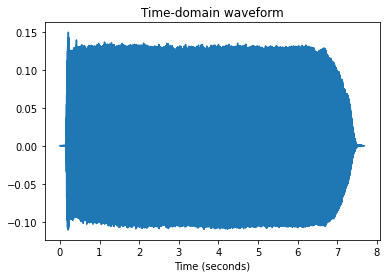

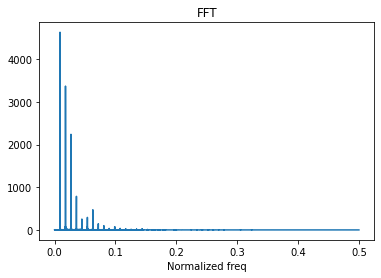

In [3]:
t = np.linspace(0, len(y)/sr, len(y))
plt.plot(t, y)
plt.xlabel('Time (seconds)')
plt.title('Time-domain waveform')
plt.show()

sp = np.abs(np.fft.rfft(y))
norm_freq = np.fft.rfftfreq(len(y))
plt.plot(norm_freq, sp)
plt.xlabel('Normalized freq')
plt.title('FFT')
plt.show()

Let's take a look at the lower frequencies, where most of the energy is concentrated. We can see some pretty clean peaks, with an obvious fundamental frequency, as well as harmonics. We can find the first harmonic frequency (in Hertz) by simply converting from normalized frequency.

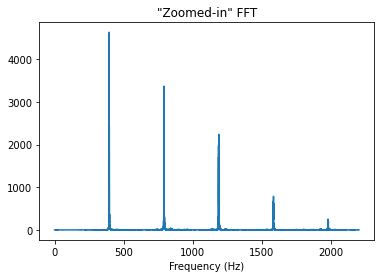

Fundamental frequency: 396.35416666666663 Hz


In [4]:
max_f = int(0.1*len(sp))
freq = norm_freq*sr

plt.plot(freq[0:max_f], sp[0:max_f])
plt.xlabel('Frequency (Hz)')
plt.title('"Zoomed-in" FFT')
plt.show()

peaks = signal.find_peaks(np.abs(sp), height = np.max(sp)/2, distance=10)
print('Fundamental frequency:', freq[peaks[0][0]], 'Hz')

Let's wrap up the above cells in a simple function that will allow us to analyze any input signal:

In [5]:
def analyze_waveform(input_signal, sr):

    y = input_signal
    
    t = np.linspace(0, len(y)/sr, len(y))
    plt.plot(t, y)
    plt.xlabel('Time (seconds)')
    plt.title('Time-domain waveform')
    plt.show()

    sp = np.abs(np.fft.rfft(y))
    norm_freq = np.fft.rfftfreq(len(y))
    plt.plot(norm_freq, sp)
    plt.xlabel('Normalized freq')
    plt.title('FFT')
    plt.show()

    max_f = int(0.1*len(sp))
    freq = norm_freq*sr

    plt.plot(freq[0:max_f], sp[0:max_f])
    plt.xlabel('Frequency (Hz)')
    plt.title('"Zoomed-in" FFT')
    plt.show()

    peaks = signal.find_peaks(np.abs(sp), height = np.max(sp)/2, distance=10)
    print('Fundamental frequency:', freq[np.argmax(sp)], 'Hz')

Let's try an example with a less straight tone:

In [6]:
y, sr = librosa.load('trombone_sample2.mp3', sr=44100)
ipd.Audio(y, rate=sr)

C:\Users\dillo\anaconda3\envs\ee301\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


This signal is slightly more complicated (and there are slight noisy artifacts as well). We can see that the peaks, and correspond frequencies, aren't as prominent.

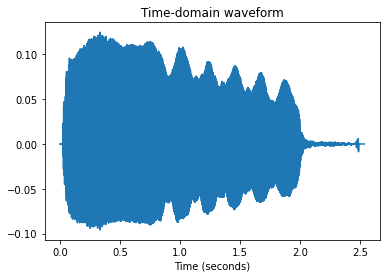

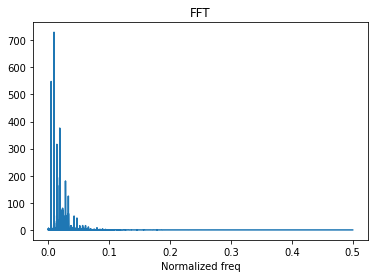

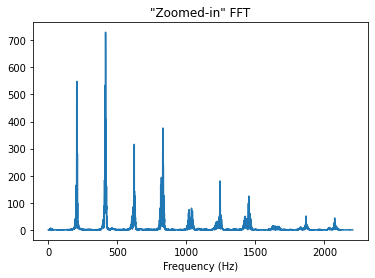

Fundamental frequency: 414.77931701030934 Hz


In [7]:
analyze_waveform(y, sr)

Now let's try a non-stationary signal: a simple scale

In [8]:
y, sr = librosa.load('trombone_scale.mp3', sr=44100)
ipd.Audio(y, rate=sr)

C:\Users\dillo\anaconda3\envs\ee301\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


What happens when we take the FFT in this case? We can see that component frequencies are not very well resolved.

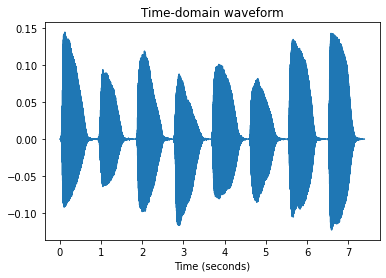

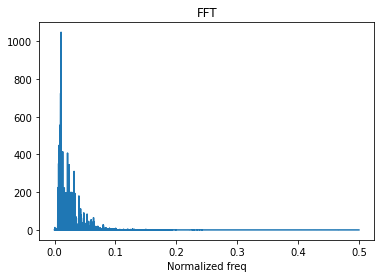

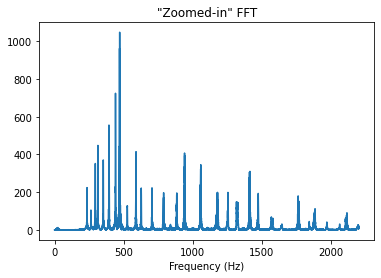

Fundamental frequency: 471.81978798586573 Hz


In [9]:
analyze_waveform(y, sr)

We can analyze how the frequency components of the signal change over time by using the short-time Fourier transform.

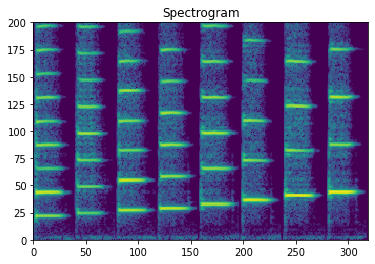

In [10]:
Y = librosa.stft(y, n_fft = 4096, hop_length = 1024, window = 'hanning')
Ydb = librosa.amplitude_to_db(abs(Y))

plt.pcolormesh(Ydb[:200,:])
plt.title('Spectrogram')
plt.show()

### Room impulse responses:

Below is a recording of the impulse response for a concert hall:

In [11]:
h, sr = librosa.load('ir_concert_hall.wav', sr=44100)
ipd.Audio(h, rate=sr)

What does convolving the impulse response with our musical instrument sound like? Note that this is linear convolution.

In [12]:
scale_concert_hall = np.convolve(y, h)
ipd.Audio(scale_concert_hall, rate=sr)

Now let's try multiplying in the frequency domain:

In [13]:
num2pad = len(y) - len(h)
h = np.pad(h,(0,num2pad))

Y = np.fft.rfft(y)
H = np.fft.rfft(h)
ipd.Audio(np.fft.irfft(Y*H), rate=sr)

It's subtle, but notice the extra note that has "wrapped around" at the beginning. This is because multiplication in the frequency domain corresponds to *circular* convolution. We can pad zeros as follows to avoid this effect:

In [14]:
num2pad = 2*len(y)-1
h_p = np.pad(h,(0,num2pad-len(h)))
y_p = np.pad(y,(0,num2pad-len(y)))

Y = np.fft.rfft(y_p)
H = np.fft.rfft(h_p)
ipd.Audio(np.fft.irfft(Y*H), rate=sr)

Another "crazy" impulse response;

In [15]:
h, sr = librosa.load('ir_slinky.wav', sr=44100)
ipd.Audio(h, rate=sr)

In [16]:
response = np.convolve(y, h)
ipd.Audio(response, rate=sr)